##**1. Business Understanding**

The data set is the **Secondary Mushroom Dataset** retrieved from the *UCI machine learning repository*. The data are synthetically generated based on the mushroom foraging guide: *The Audubon Society Field Guide to North American Mushrooms (1981) by Alfred A. Knopf*. The data set contains 61,069 observations and 21 features. There are 17 categorical features and 3 numeric features. Mushroom features are organized into four structural categories: cap, gills, stem, and veil. Within each of these four categories, there are features related to the size, color, and shape of the mushroom. Other features include whether or not the mushroom bleeds or bruises and characteristics related to the spore print color, habitat, ring, and season of the mushroom.


The dataset was created as a part of **Dennis Wagner’s** Bachelor’s thesis titled: *‘Mushroom data creation, curation, and simulation to support classification tasks’ (2021)*. The dataset provides characteristics of mushrooms along with the edibility/toxicity for the purpose of classifying fungi and training classification models in machine learning research and education.


**The prediction task for this dataset is to predict whether a given mushroom is poisonous based on its physical characteristics**. The resulting model would be of use to mycology researchers interested in quickly classifying mushroom specimen, or by mushroom foraging enthusiasts who want to avoid having to peruse a foraging guide. Ultimately, this model could benefit both researchers and hobbyists by providing fast and accurate prediction results.

Because the prediction task relates to the toxicity of mushrooms, the prediction algorithm must perform very well in order to be used safely and practically. Ideally, sensitivity will be inflated relative to other metrics in the model because it is more important to correctly identify a poisonous mushroom than to identify a non-poisonous one. Let us specify a **sensitivity of at least 0.95 as a target metric for our model**.


##**2. Data Understanding**
 Data Source : https://archive.ics.uci.edu/ml/datasets/Secondary+Mushroom+Dataset

This dataset includes **61069** hypothetical mushrooms with caps based on **173** species (353 mushrooms
per species *italicized text*). Each mushroom is identified as definitely ***edible***, ***definitely poisonous***, or of
***unknown edibility*** and ***not recommended*** (*the latter class was combined with the poisonous class*).

###**2.1 Feature Information**

**1. cap-diameter (m):** Diameter of the Mushroom Cap/Top.

**2. cap-shape (n):** Shape of the Mushroom Cap in mm.

**3. cap-surface (n):** Texture and Characteristic of Mushroom Head.

**4. cap-color (n):** Colour of the Mushroom Top.

**5. does-bruise-bleed (n):** Do any cut in the Mushroom Bleed or Not.

**6. gill-attachment (n):**  Type of Spore Dispersal attachment on Mushroom.

**7. gill-spacing (n):** Distance Between Gill Spacing.

**8. gill-color (n)**: Colour of the spore dispersal gill.

**9. stem-height (m):** Height of the stem in cm

**10. stem-width (m):** Width of the stem in centimeters.

**11. stem-root (n):** Structure of the stem root of mushroom.

**12. stem-surface (n):** whether or not stem surface is same as Mushroom cap.

**13. stem-color (n):** Whether stem colour is as same as Cap.

**14. veil-type (n):** Type of the Veil on cap bottom.

**15. veil-color (n):** Whether it's same as cap colour or not.

**16. has-ring (n):** Does Mushroom have rin on cap or cap.

**17. ring-type (n):** Type of the ring.

**18. spore-print-color (n):** Whether its same as Cap colour or not.

**19. habitat (n):** habitat of the Mushroom

**20. season (n):** Season in which the Mushroom Grows.


###**2.2 Attribute Information :**

One binary class divided in edible=e and poisonous=p (with the latter one also containing mushrooms of unknown edibility).
Twenty remaining variables (n: nominal, m: metrical)

**1. cap-diameter (m):** float number in cm

**2. cap-shape (n):** bell=b, conical=c, convex=x, flat=f,
sunken=s, spherical=p, others=o

**3. cap-surface (n):** fibrous=i, grooves=g, scaly=y, smooth=s,
shiny=h, leathery=l, silky=k, sticky=t,
wrinkled=w, fleshy=e

**4. cap-color (n):** brown=n, buff=b, gray=g, green=r, pink=p,
purple=u, red=e, white=w, yellow=y, blue=l,
orange=o, black=k

**5. does-bruise-bleed (n):** bruises-or-bleeding=t,no=f

**6. gill-attachment (n):** adnate=a, adnexed=x, decurrent=d, free=e,
sinuate=s, pores=p, none=f, unknown=?

**7. gill-spacing (n):** close=c, distant=d, none=f

**8. gill-color (n)**: see cap-color + none=f

**9. stem-height (m):** float number in cm

**10. stem-width (m):** float number in mm

**11. stem-root (n):** bulbous=b, swollen=s, club=c, cup=u, equal=e,
rhizomorphs=z, rooted=r

**12. stem-surface (n):** see cap-surface + none=f

**13. stem-color (n):** see cap-color + none=f

**14. veil-type (n):** partial=p, universal=u

**15. veil-color (n):** see cap-color + none=f

**16. has-ring (n):** ring=t, none=f

**17. ring-type (n):** cobwebby=c, evanescent=e, flaring=r, grooved=g,
large=l, pendant=p, sheathing=s, zone=z, scaly=y, movable=m, none=f, unknown=?

**18. spore-print-color (n):** see cap color

**19. habitat (n):** grasses=g, leaves=l, meadows=m, paths=p, heaths=h,
urban=u, waste=w, woods=d

**20. season (n):** spring=s, summer=u, autumn=a, winter=w

###**2.3 Importing dataset & packages**

In [ ]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
import missingno
import random
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
from re import sub
warnings.filterwarnings("ignore")

#We need to provide a seperator as the data that we have is a single column data with values seprated by ";"
mushroom_df=pd.read_csv('secondary_data.csv',sep=';')

In [ ]:
mushroom_df

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,...,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,p,15.26,x,g,o,f,e,NaN,w,16.95,...,s,y,w,u,w,t,g,NaN,d,w
1,p,16.60,x,g,o,f,e,NaN,w,17.99,...,s,y,w,u,w,t,g,NaN,d,u
2,p,14.07,x,g,o,f,e,NaN,w,17.80,...,s,y,w,u,w,t,g,NaN,d,w
3,p,14.17,f,h,e,f,e,NaN,w,15.77,...,s,y,w,u,w,t,p,NaN,d,w
4,p,14.64,x,h,o,f,e,NaN,w,16.53,...,s,y,w,u,w,t,p,NaN,d,w
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61064,p,1.18,s,s,y,f,f,f,f,3.93,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,a
61065,p,1.27,f,s,y,f,f,f,f,3.18,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,a
61066,p,1.27,s,s,y,f,f,f,f,3.86,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u
61067,p,1.24,f,s,y,f,f,f,f,3.56,...,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u


###**2.4 Data Description**

In [ ]:
mushroom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61069 entries, 0 to 61068
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   class                 61069 non-null  object 
 1   cap-diameter          61069 non-null  float64
 2   cap-shape             61069 non-null  object 
 3   cap-surface           46949 non-null  object 
 4   cap-color             61069 non-null  object 
 5   does-bruise-or-bleed  61069 non-null  object 
 6   gill-attachment       51185 non-null  object 
 7   gill-spacing          36006 non-null  object 
 8   gill-color            61069 non-null  object 
 9   stem-height           61069 non-null  float64
 10  stem-width            61069 non-null  float64
 11  stem-root             9531 non-null   object 
 12  stem-surface          22945 non-null  object 
 13  stem-color            61069 non-null  object 
 14  veil-type             3177 non-null   object 
 15  veil-color         


1.   From data description we can see that some of the columns have missing data as altogether all the column should have 61069 records.
2.   We can see that most of the features here are categorical with only 3 features being numerical.
3.   Our Next object is to first Impute/Drop the Missing values. then Find the Relevant Columns and Then Draw some valuable conclusions.
4.   we will make use of KNN Split Impute Method nto deal to missing values.


###**2.5 Data Cleaning**

####**2.5.1 Removing duplicate samples**

In [ ]:
mushroom_df.duplicated().sum()

146

we can see that there are few duplicate samples which we don't need as they are redundant, so lets go ahead and drop them

In [ ]:
mushroom_df = mushroom_df.drop_duplicates()
mushroom_df.duplicated().sum()

0

####**2.5.2 : Checking Missing values**

In [ ]:
mushroom_df.isna().sum()

,0
class,0
cap-diameter,0
cap-shape,0
cap-surface,14120
cap-color,0
does-bruise-or-bleed,0
gill-attachment,9855
gill-spacing,25062
gill-color,0
stem-height,0


<Axes: >

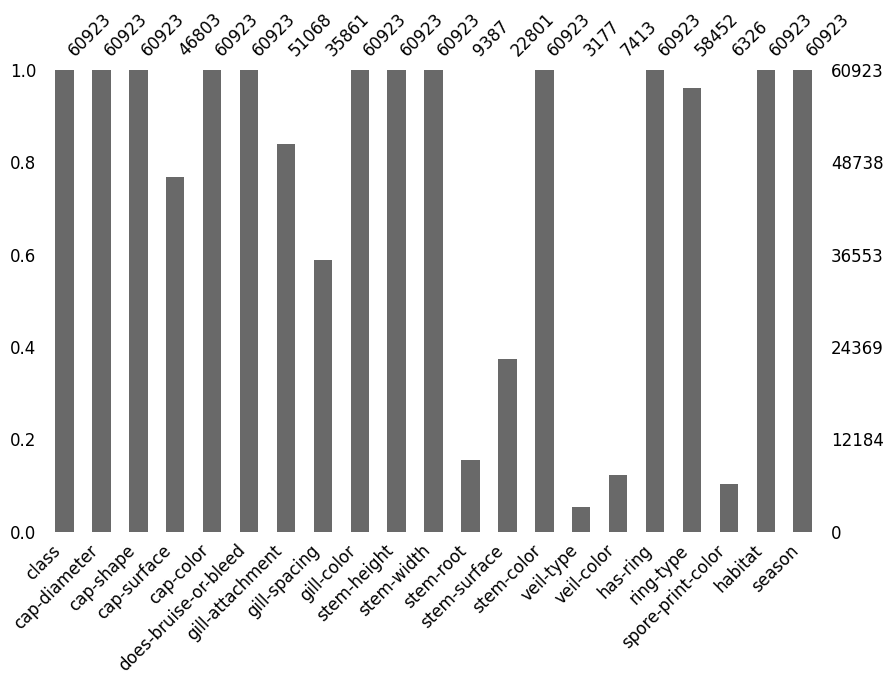

In [ ]:
missingno.bar(mushroom_df, figsize=(10,6), fontsize=12)

We can see that some features have lots of missing data, from prelimnary analysis we can be tempted to drop some rows however, some of this features have lots of missing data because they are dependent on other features, to see if they inherit they same data and if not then they are left blank. So we must understand this relation through some visualization before imputing or eliminating the data points.

####**2.5.3 Visualizing Categorical Features**

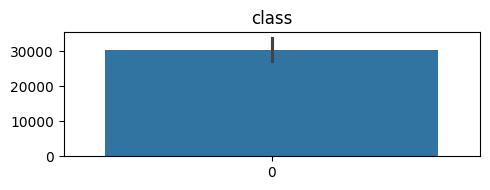

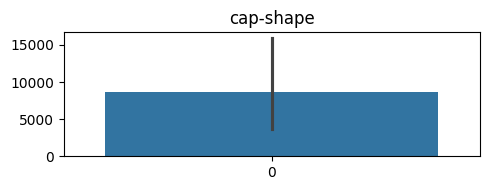

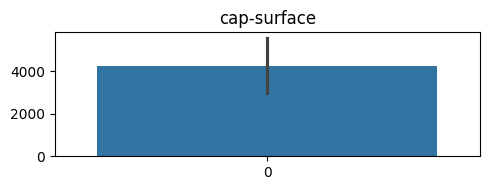

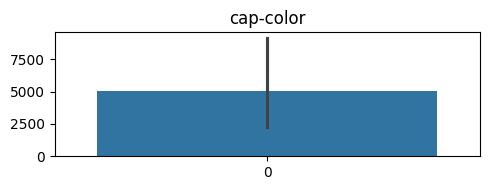

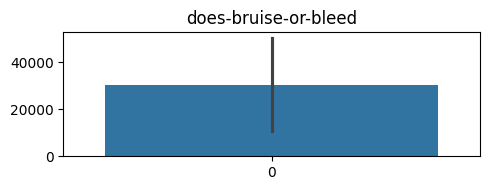

...

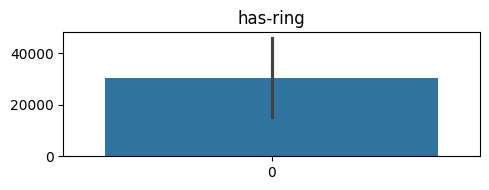

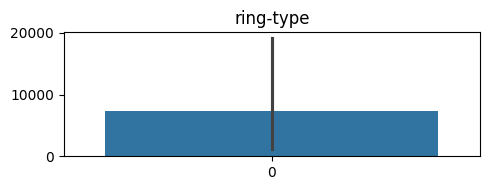

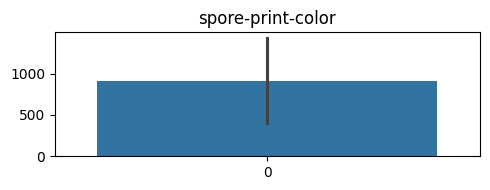

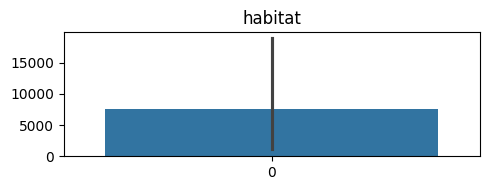

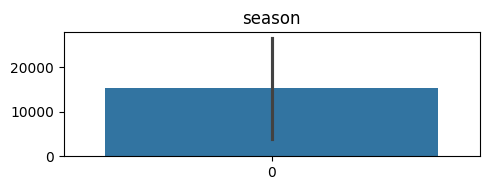

In [ ]:
Mushroom_categorcial= ['class',"cap-shape","cap-surface","cap-color",'does-bruise-or-bleed','gill-attachment','gill-spacing','gill-color','stem-root','stem-surface','stem-color','veil-type','veil-color','has-ring','ring-type','spore-print-color','habitat','season']

for feature in Mushroom_categorcial:
    plt.figure(figsize=(5,2))
    sns.barplot((mushroom_df[feature].value_counts().values, mushroom_df[feature].value_counts().index))
    plt.title(feature)
    plt.tight_layout()

For each categorical variable, there seems to be one or two levels that are predominantly present in the dataset. A handful of the levels may only have a few observations relative to the others. In the outcome variable, "class", there is some mild class imbalance, with more poisonous observations than non-poisonous ones, although this imbalance likely wouldn't be a cause for concern for a prediction task.

#### **2.5.4 Visualizing Numeric Features**

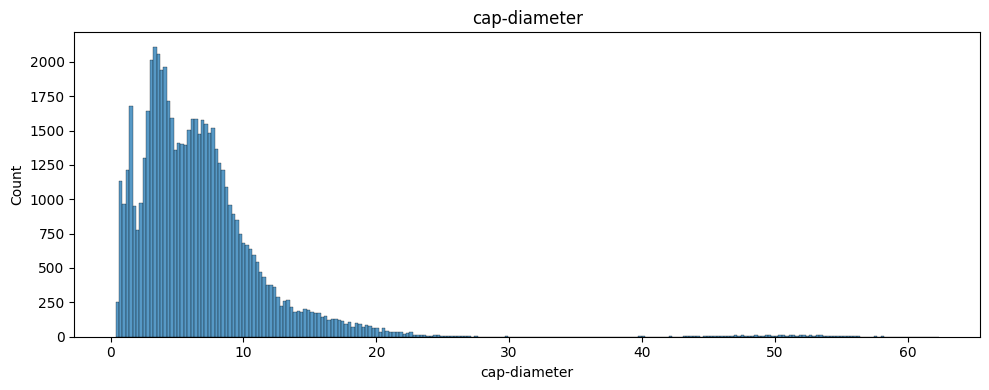

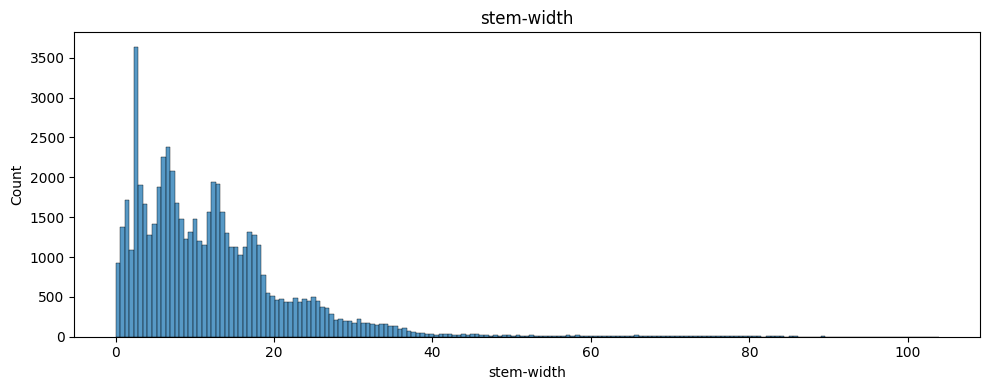

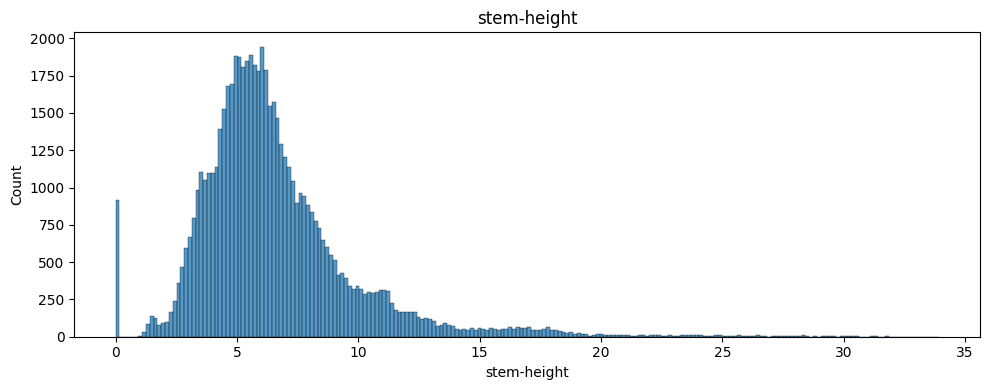

In [ ]:
mushroom_numeric = ['cap-diameter','stem-width','stem-height']

for feature in mushroom_numeric:
    plt.figure(figsize=(10,4))
    sns.histplot(data=mushroom_df, x=feature)
    plt.title(feature)
    plt.tight_layout()

All three numeric variables appear strongly right skewed. For the stem width variable, there are a group of observations with a stem with of zero because many mushrooms grow without a stem at all.


Now that we are done with exploratory data analysis, we can convert categorical data into numeric data types. Also, now we can decide which columns to drop and how to deal with missing data.

##**3. Data Preparation**

### **3.1 Imputation: Split-Impute-Combine with k-NN imputation**

To deal with the missing data, the split-impute-combine method will be used in conjunction with k-Nearest-Neighbors imputation. First, let us observe the percentage of missing observations in each feature that contains missing data.

In [ ]:
# See percentage missing for each column that contains missing values
columns_withnulls = ['cap-surface', 'gill-attachment', 'gill-spacing', 'stem-root', 'stem-surface',
                     'veil-type', 'veil-color', 'ring-type', 'spore-print-color']

for col in columns_withnulls:
    print(col, "-> ", np.round(len(mushroom_df[mushroom_df[col].isna()][col]) /  mushroom_df.shape[0]*100,2),
         "%")

cap-surface ->  23.18 %
gill-attachment ->  16.18 %
gill-spacing ->  41.14 %
stem-root ->  84.59 %
stem-surface ->  62.57 %
veil-type ->  94.79 %
veil-color ->  87.83 %
ring-type ->  4.06 %
spore-print-color ->  89.62 %


The columns describing veil type, veil color, and spore print color will be dropped because they contain more than 85% missing values. The cut off point is arbitrary, but it was set relatively high because the dataset is quite large (~61,000 observations).

Additionally, variables describing the class (toxicity), whether the mushroom bruises or bleeds, and whether the mushroom has a ring will be converted to binary type variables using 0 and 1. For the class variable, 1 represents poisonous mushrooms because that is the more concerning class. For the ring and bruising/bleed variables, 1 will represent "true" (i.e., the mushroom has a ring or does bruise or bleed) and 0 will represent "false" (i.e. the mushroom does not have a ring or does not bruise or bleed).

Furthermore, the categorical variables will be coded to integers only for imputation. The levels will be encoded starting from 0 and applied in alphabetical order. This method is used because the k-NN imputer cannot perform imputation on non-numeric data. An alternative option would be to dummy encode the categorical columns before using the k-NN imputer, but method would not make sense because the imputer would not be able to guarantee that each imputed value can only be assigned to one category for each nominal variable.

The strategy and code was obtained from:
+ Source: https://stackoverflow.com/questions/64900801/implementing-knn-imputation-on-categorical-variables-in-an-sklearn-pipeline

In [ ]:
# Drop columns with more than 85% missing values.
mushroom_df_dropped = mushroom_df.drop(['veil-type', 'veil-color','spore-print-color'], axis=1)

mushroom_df_up = mushroom_df_dropped.copy()

#Class Feauture : Map poisionous(p) to 1 and Edible(e) to 0
#does-bruise-or-bleed: If its false then 0 else 1
#has-Ring : we can map f=0 and t=1
mushroom_df_up['class'] = mushroom_df_up['class'].map({'p': 1, 'e': 0})
mushroom_df_up['does-bruise-or-bleed'] = mushroom_df_up['does-bruise-or-bleed'].map({'t': 1, 'f': 0})
mushroom_df_up['has-ring'] = mushroom_df_up['has-ring'].map({'t': 1, 'f': 0})

# Source for strategy and code:
# https://stackoverflow.com/questions/64900801/implementing-knn-imputation-on-categorical-variables-in-an-sklearn-pipeline
mushroom_encoded = mushroom_df_up.apply(lambda series: pd.Series(LabelEncoder().fit_transform(series[series.notnull()]),
    index=series[series.notnull()].index))

Next, the numeric data will be scaled/Standardized using the method adapted from Dr. Eric Larson's repository:
+ Source: https://github.com/eclarson/MachineLearningNotebooks/blob/master/03.%20DataVisualization.ipynb

In [ ]:
vars_to_scale = ['cap-diameter','stem-height','stem-width']
mushroom_scaled = mushroom_encoded.copy()
for var in vars_to_scale:
    mushroom_scaled[var] = (mushroom_scaled[var] - np.mean(mushroom_scaled[var])) / np.std(mushroom_scaled[var])

To incorporate the Split-Impute-Combine method, the data will be split based on the 12 levels of gill color. According to the article cited below on identifying poisonous mushrooms, white gills are a common indicator of toxicity. Drawing on this domain knowledge, we will split by gill color in hopes that the imputations may give more accurate results for identifying poisonousness.

+ Domain Knowledge Source: https://environment.co/how-to-identify-poisonous-mushrooms/

In [ ]:
# Split by gill color in hopes that the imputations will give results that may indicate poisonousness.
# Create separate datasets
mushroom_gc0 = mushroom_scaled[mushroom_scaled['gill-color'] == 0]
mushroom_gc1 = mushroom_scaled[mushroom_scaled['gill-color'] == 1]
mushroom_gc2 = mushroom_scaled[mushroom_scaled['gill-color'] == 2]
mushroom_gc3 = mushroom_scaled[mushroom_scaled['gill-color'] == 3]
mushroom_gc4 = mushroom_scaled[mushroom_scaled['gill-color'] == 4]
mushroom_gc5 = mushroom_scaled[mushroom_scaled['gill-color'] == 5]
mushroom_gc6 = mushroom_scaled[mushroom_scaled['gill-color'] == 6]
mushroom_gc7 = mushroom_scaled[mushroom_scaled['gill-color'] == 7]
mushroom_gc8 = mushroom_scaled[mushroom_scaled['gill-color'] == 8]
mushroom_gc9 = mushroom_scaled[mushroom_scaled['gill-color'] == 9]
mushroom_gc10 = mushroom_scaled[mushroom_scaled['gill-color'] == 10]
mushroom_gc11 = mushroom_scaled[mushroom_scaled['gill-color'] == 11]

Because gill color has so many levels, three of the splits have 100% missing values for either the stem root or stem surface variable (discovered by error). For these splits, the mode of the respective columns will be imputed to allow the k-NN imputer to run properly.

In [ ]:
# Splits are too small, some splits have NaNs for the entire column. Those items will just be replaced by the mode
mushroom_gc0['stem-root'] = 4
mushroom_gc0['stem-surface'] = 5
mushroom_gc1['stem-surface'] = 5
mushroom_gc4['stem-root'] = 4

Now, k-NN imputation is performed using the value of first (1) nearest neighbor. The k-NN imputer does not have the option to impute the mode of the nearest neighbors if more than one neighbor is found. The only option for the k-NN imputer is to impute the mean if more than one neighbor is found. This method would not make sense for categorical variables because a mean of integer encoded categorical variables would be meaningless (i.e., the alphabetical order of the levels has no indication of the most likely value).

This strategy was borrowed from the same source referenced above, cited again here:
+ Source: https://stackoverflow.com/questions/64900801/implementing-knn-imputation-on-categorical-variables-in-an-sklearn-pipeline

In [ ]:
# Using 1 nearest neighbor, because kNN encoder cannot substitute a mode for multiple neighbors.
imputer = KNNImputer(n_neighbors=1, weights="uniform")
mushroom_imputed_gc0 = pd.DataFrame(imputer.fit_transform(mushroom_gc0))
mushroom_imputed_gc1 = pd.DataFrame(imputer.fit_transform(mushroom_gc1))
mushroom_imputed_gc2 = pd.DataFrame(imputer.fit_transform(mushroom_gc2))
mushroom_imputed_gc3 = pd.DataFrame(imputer.fit_transform(mushroom_gc3))
mushroom_imputed_gc4 = pd.DataFrame(imputer.fit_transform(mushroom_gc4))
mushroom_imputed_gc5 = pd.DataFrame(imputer.fit_transform(mushroom_gc5))
mushroom_imputed_gc6 = pd.DataFrame(imputer.fit_transform(mushroom_gc6))
mushroom_imputed_gc7 = pd.DataFrame(imputer.fit_transform(mushroom_gc7))
mushroom_imputed_gc8 = pd.DataFrame(imputer.fit_transform(mushroom_gc8))
mushroom_imputed_gc9 = pd.DataFrame(imputer.fit_transform(mushroom_gc9))
mushroom_imputed_gc10 = pd.DataFrame(imputer.fit_transform(mushroom_gc10))
mushroom_imputed_gc11 = pd.DataFrame(imputer.fit_transform(mushroom_gc11))

Next, let us **recombine the split groups** to form a complete dataset.

In [ ]:
# Combine
mushroom_imputed = pd.concat([mushroom_imputed_gc0.reset_index(drop=True),
                              mushroom_imputed_gc1.reset_index(drop=True),
                              mushroom_imputed_gc2.reset_index(drop=True),
                              mushroom_imputed_gc3.reset_index(drop=True),
                              mushroom_imputed_gc4.reset_index(drop=True),
                              mushroom_imputed_gc5.reset_index(drop=True),
                              mushroom_imputed_gc6.reset_index(drop=True),
                              mushroom_imputed_gc7.reset_index(drop=True),
                              mushroom_imputed_gc8.reset_index(drop=True),
                              mushroom_imputed_gc9.reset_index(drop=True),
                              mushroom_imputed_gc10.reset_index(drop=True),
                              mushroom_imputed_gc11.reset_index(drop=True)],
                            axis = 0)
mushroom_imputed.columns = mushroom_encoded.columns
mushroom_imputed_cp = mushroom_imputed.copy()

Here, the integers are coded back to the original string values to **restore meaning** to the dataset values.

In [ ]:
# recode back to letters
cap_shape_map = {0:'b', 1:'c', 2:'f', 3:'o', 4:'p', 5:'s', 6:'x'}
cap_surface_map = {0:'e', 1:'i', 2:'g', 3:'h', 4:'k', 5:'l', 6:"s",
                  7:'t', 8:'w', 9:'y', 10: 'z'}
cap_color = {0:'b', 1:'e', 2:'g', 3:'k', 4:'l', 5:'n',6:'o', 7:'p', 8:'r', 9:'u',
            10:'w', 11:'y'}
gill_attach_map = {0:'a', 1:'d', 2:'e', 3:'f', 4:'p', 5:'s', 6:'x'}
gill_spacing_map = {0:'c', 1:'d', 2:'f'}
gill_color_map = {0:'b', 1:'e', 2:'f', 3:'g', 4:'k', 5:'l',6:'n', 7:'o', 8:'p', 9:'r',
            10:'u', 11:'w'}
stem_root_map = {0:'b', 1:'c', 2:'e', 3:'r', 4:'s'}
stem_surface_map = {0:'f', 1:'g', 2:'h', 3:'i', 4:'k', 5:'s', 6:'t', 7:'y'}
stem_color_map = {0:'b', 1:'e', 2:'f', 3:'g', 4:'k', 5:'l', 6:'n', 7:'o', 8:'p', 9:'r',
                  10:'u', 11:'w', 12:'y'}
ring_type_map = {0:'e', 1:'f', 2:'g', 3:'l', 4:'m', 5:'p', 6:'r', 7:'z'}
habitat_map = {0:'d', 1:'g', 2:'h', 3:'l', 4:'m', 5:'p', 6:'u', 7:'w'}
season_map = {0:'a', 1:'s', 2:'u', 3:'w'}

In [ ]:
mush_maps = [cap_shape_map, cap_surface_map, cap_color, gill_attach_map, gill_spacing_map,
            gill_color_map, stem_root_map, stem_surface_map, stem_color_map, ring_type_map, habitat_map, season_map]

cols_to_convert = ['cap-shape', 'cap-surface', 'cap-color', 'gill-attachment', 'gill-spacing',
                 'gill-color', 'stem-root', 'stem-surface', 'stem-color', 'ring-type', 'habitat', 'season']

for col in cols_to_convert:
    mushroom_imputed[col] = mushroom_imputed[col].map(mush_maps[cols_to_convert.index(col)])

Finally, here we can see that the columns of interest now have no missing data. Success!

In [ ]:
# Get percentage missing for all features that contained missing values
columns_withnulls = ['cap-surface', 'gill-attachment', 'gill-spacing', 'stem-root', 'stem-surface','ring-type']

for col in columns_withnulls:
    print(col, "-> ", len(mushroom_imputed[mushroom_imputed[col].isna()][col]) /  mushroom_imputed.shape[0]*100,
         "%")

cap-surface ->  0.0 %
gill-attachment ->  0.0 %
gill-spacing ->  0.0 %
stem-root ->  0.0 %
stem-surface ->  0.0 %
ring-type ->  0.0 %


#### **2.7.1 Visualizations with a Complete Dataset**

Now that we have a complete dataset, we will do a deeper dive using visualizations to explore the relationship between the features themselves, and between the features and the outcome (toxicity).

First, we observe a correlation plot that measures the correlation between the numeric features and the binary encoded features.

Out of these 21 feature combinations, stem width and cap diameter of the mushroom are the most strongly correlated with a correlation coefficient of 0.8. This pair is followed by stem height and cap diameter of the mushroom with a correlation coefficient of 0.52. Lastly, stem heigth and stem width are fairly correlated, with a correlation coefficient of 0.44.

Unfortunately, none of these variables seem to be even moderately correlated with the outcome class.

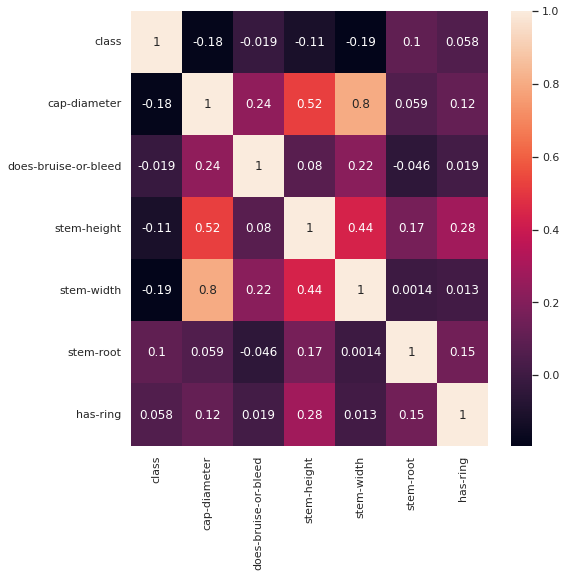

In [ ]:
# Correlation plot. Code borrowed from Dr. Eric Larson's repository: https://github.com/eclarson/MachineLearningNotebooks/blob/master/03.%20DataVisualization.ipynb
cmap = sns.set(style="darkgrid") # one of the many styles to plot using

f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(mushroom_imputed.corr(), cmap=cmap, annot=True)

Based on the findings from the correlation plot, let us observe the relationship between the most correlated feature pairs more closely.

Text(0.5, 1.0, 'Stem Height vs Stem Width')

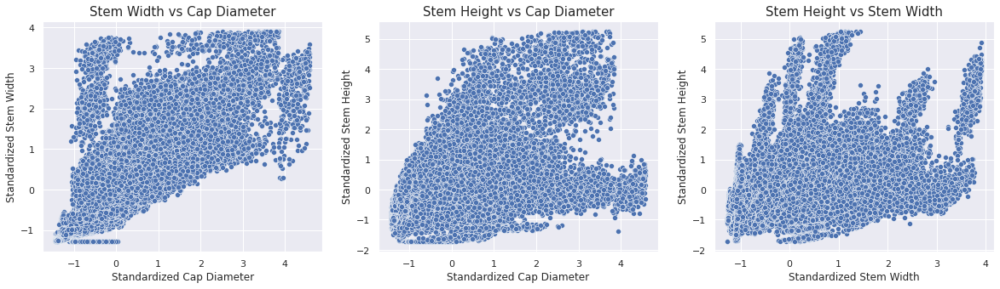

In [ ]:
# Adapted from Dr. Eric Larson's Data Visualization notebook refernced several times above.
# Was unable to refernce columns by name. Source: https://github.com/mwaskom/seaborn/issues/2279
plt.figure(figsize=(20,5))
ax1 = plt.subplot(1,3,1)
ax2 = plt.subplot(1,3,2)
ax3 = plt.subplot(1,3,3)

sns.scatterplot(x=mushroom_imputed.iloc[:,1],
                y=mushroom_imputed.iloc[:,10], ax = ax1)
ax1.set_xlabel("Standardized Cap Diameter")
ax1.set_ylabel("Standardized Stem Width")
ax1.set_title("Stem Width vs Cap Diameter", fontsize = 15)

sns.scatterplot(x=mushroom_imputed.iloc[:,1],
                y=mushroom_imputed.iloc[:,9], ax = ax2)
ax2.set_xlabel("Standardized Cap Diameter")
ax2.set_ylabel("Standardized Stem Height")
ax2.set_title("Stem Height vs Cap Diameter", fontsize = 15)

sns.scatterplot(x=mushroom_imputed.iloc[:,10],
                y=mushroom_imputed.iloc[:,9], ax = ax3)
ax3.set_xlabel("Standardized Stem Width")
ax3.set_ylabel("Standardized Stem Height")
ax3.set_title("Stem Height vs Stem Width", fontsize = 15)

From the plots above, we can assess the strength of the correlation visually. All three of the plots display a moderate or strong positive correlation. The left most plot displays the strongest correlation, because the data adheres strongly to the line y = x. In all three plots there appears to be clusters of data points that are gathered in certain neighborhoods of the feature ranges. Let's observe these clusters more closely to see if any other variable could indicate the reasons for these clusters.

In [ ]:
# Generate sample to reduce computation time
# Source: https://www.geeksforgeeks.org/python-random-sample-function/
random.seed(7324)
my_sample = random.sample(range(mushroom_imputed.shape[0]), 30000)
mushroom_sample = mushroom_imputed.iloc[my_sample,:].copy()

# Defining function to clean up graph labels
# Source: https://www.w3resource.com/python-exercises/string/python-data-type-string-exercise-96.php
def camel_case(s):
    s = sub(r"(_|-)+", " ", s).title()
    return s

#### **Relationships between Pairs of Numeric Outcomes and Categorical Variables**

Here, the three most strongly correlated pairs of numeric variables are plotted with the observations colored by the levels of each categrical variable. These graphs are useful for visually assessing paired ranges of numeric outcomes that might be associated with a particular level of a categorical variable.

For example, in each plot of stem width against cap diameter, there are two distinct clusters with short cap diameters and large stem widths. Using these plots, we can see that the group of observations with the largest stem widths consists of non-poisonous mushrooms with a smooth cap surface (s), pink cap color (p), brown stem color (n), and have no ring. On the other hand, the group of observations with the slightly smaller stem widths consists of poisonous mushrooms with a scaly cap surface (y), white cap color (w), and white stem color (w).

These plots are particularly usefull for observing patterns within mushroom specimen groups that have numeric values on the extreme ranges, because many of the speicmen with middle range values have overlapping features that do not form distinct clusters.

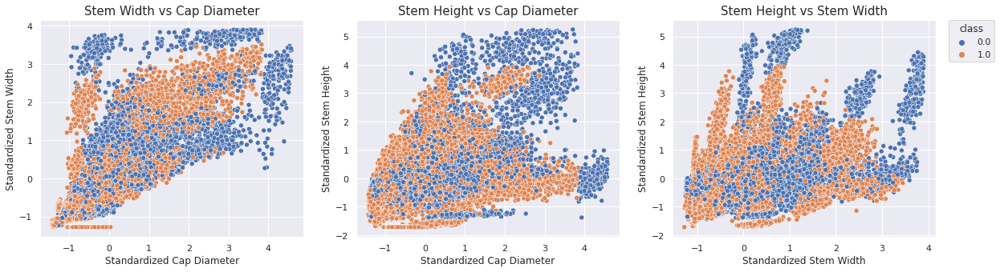

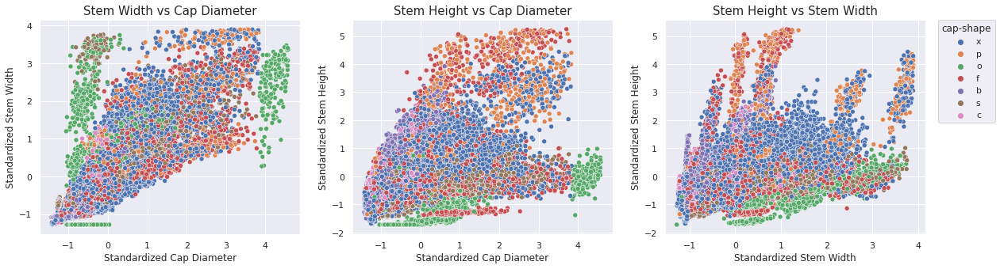

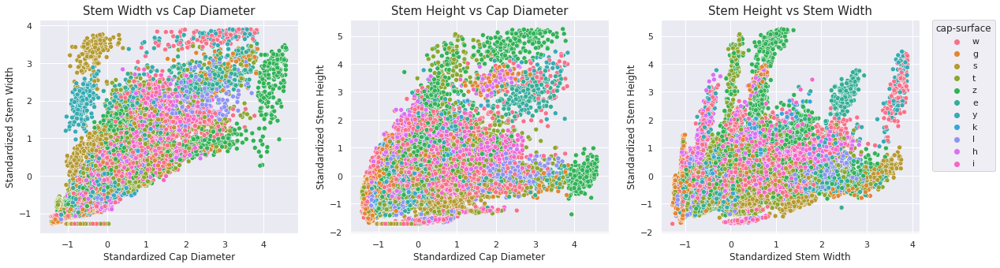

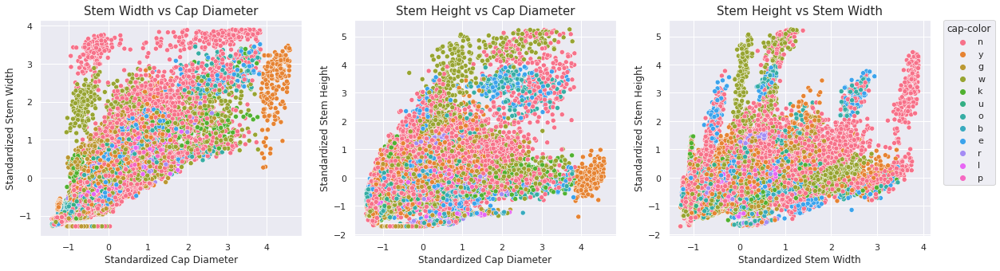

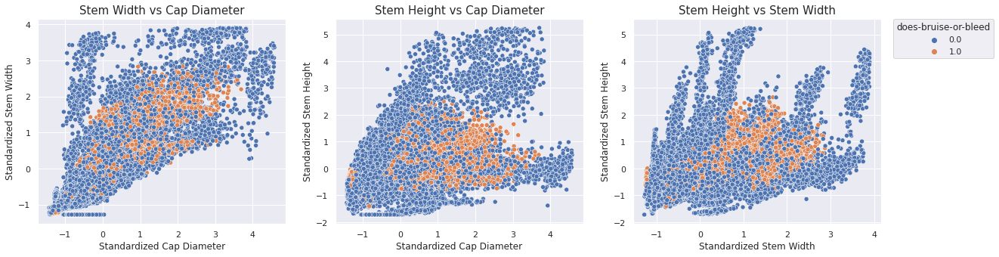

...

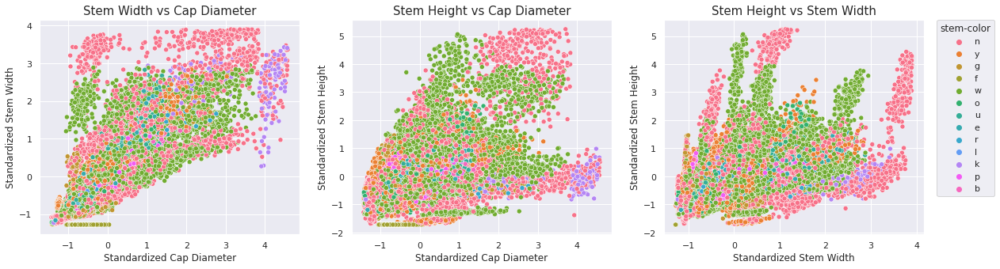

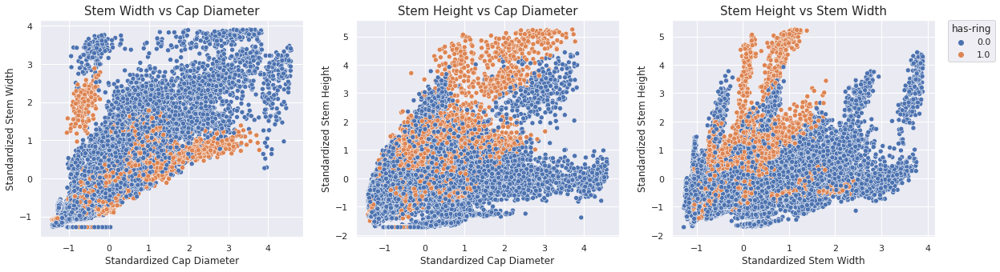

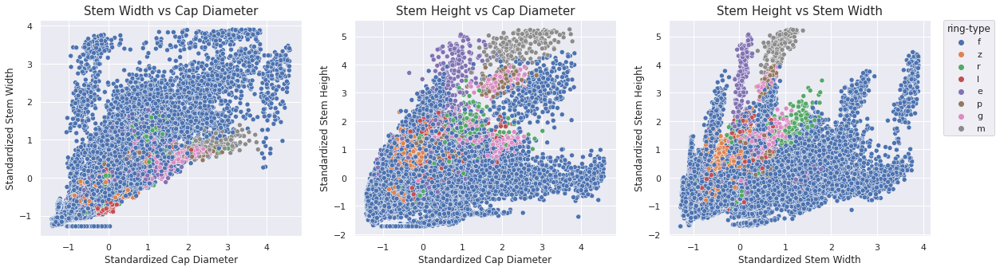

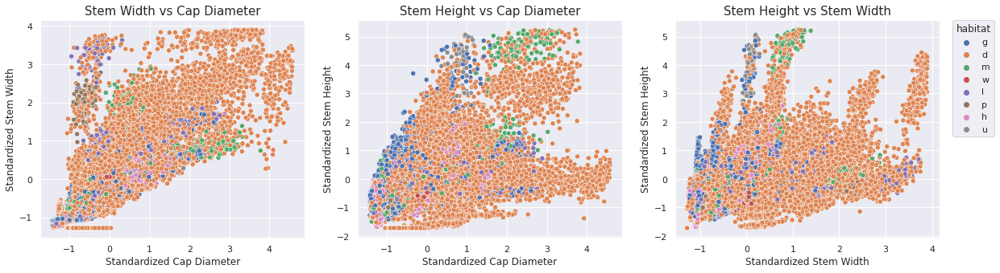

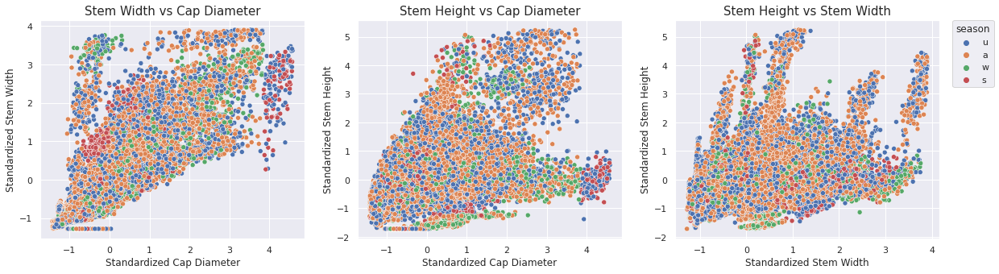

In [ ]:
cat_feats_to_compare = [0, *np.arange(2,9), *np.arange(11,18)]

for var in cat_feats_to_compare:
    plt.figure(figsize=(20,5))
    ax1 = plt.subplot(1,3,1)
    ax2 = plt.subplot(1,3,2)
    ax3 = plt.subplot(1,3,3)

    sns.scatterplot(x=mushroom_sample.iloc[:,1],
                y=mushroom_sample.iloc[:,10],
                hue = mushroom_sample.iloc[:,var],
                ax = ax1, legend = False)
    ax1.set_xlabel("Standardized Cap Diameter")
    ax1.set_ylabel("Standardized Stem Width")
    ax1.set_title("Stem Width vs Cap Diameter", fontsize = 15)

    sns.scatterplot(x=mushroom_sample.iloc[:,1],
                    y=mushroom_sample.iloc[:,9],
                    hue = mushroom_sample.iloc[:,var],
                    ax = ax2, legend = False)
    ax2.set_xlabel("Standardized Cap Diameter")
    ax2.set_ylabel("Standardized Stem Height")
    ax2.set_title("Stem Height vs Cap Diameter", fontsize = 15)

    sns.scatterplot(x=mushroom_sample.iloc[:,10],
                    y=mushroom_sample.iloc[:,9],
                    hue = mushroom_sample.iloc[:,var],
                    ax = ax3)
    ax3.set_xlabel("Standardized Stem Width")
    ax3.set_ylabel("Standardized Stem Height")
    ax3.set_title("Stem Height vs Stem Width", fontsize = 15)
    # Source: https://www.statology.org/seaborn-legend-outside/
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
               title = mushroom_sample.columns[var])
    plt.show()

#### **Relationships Between Categorical and Continuous Variables Stratified by Outcome (Toxicity)**

Here, we observe some violin plots comparing the distribution of each of the three numeric variables (cap diameter, stem height, and stem width) stratified first by the level of each categorical variable and then color coded by the outcome.

These plots would be useful for visually assessing potential interactions between a numeric and categorical variable in relation to the outcome.

For example, for those mushroom specimen that have a ring, the distribution of cap diameter length is slightly larger (shifted to the right) for non-poisonous mushrooms than for poisonous mushrooms. The same phenomenon occurs for stem width.

Likewise, for mushroom specimen with an equal type stem root (level "e"), the distribution of stem width for nonpoisonous mushrooms appears inverted relative to that of poisonous mushrooms. For instance, poisonous mushrooms typically have very small or medium-long stem widths, while non-poisonous mushrooms typically have medium or very long stem widths.

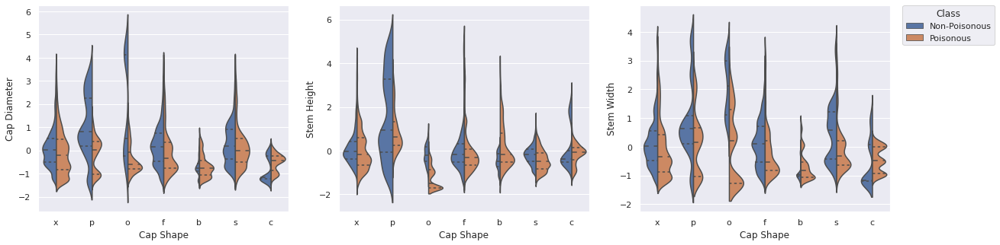

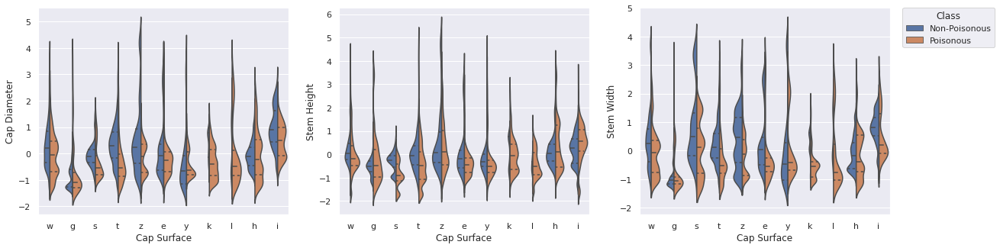

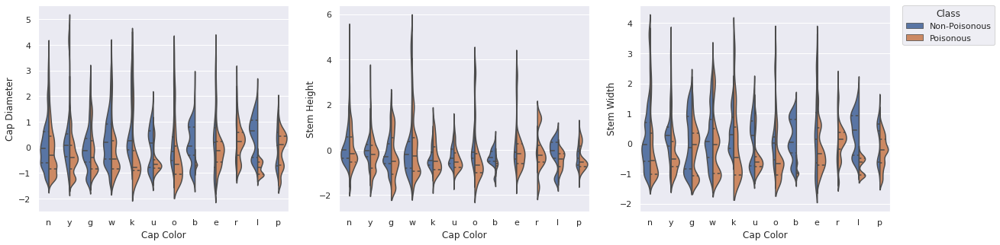

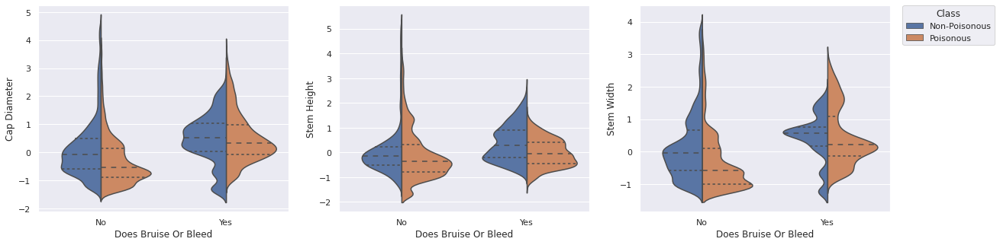

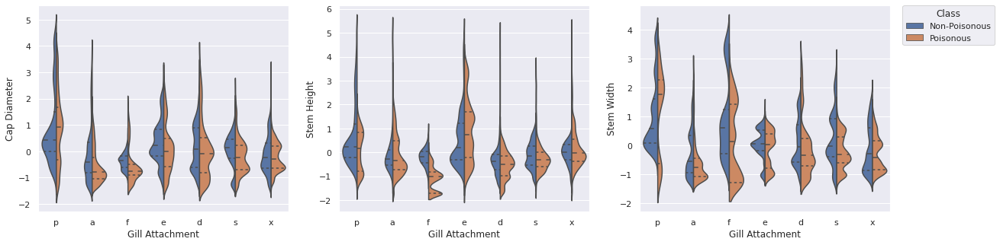

...

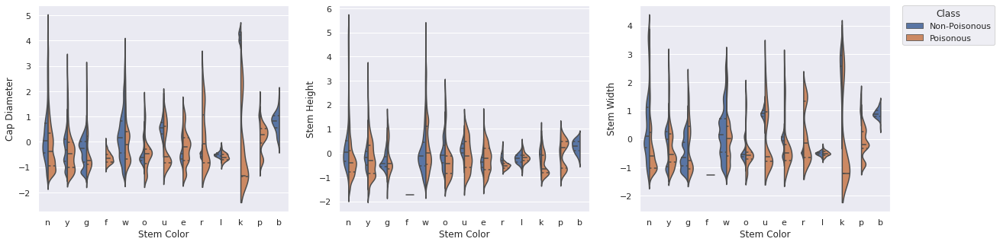

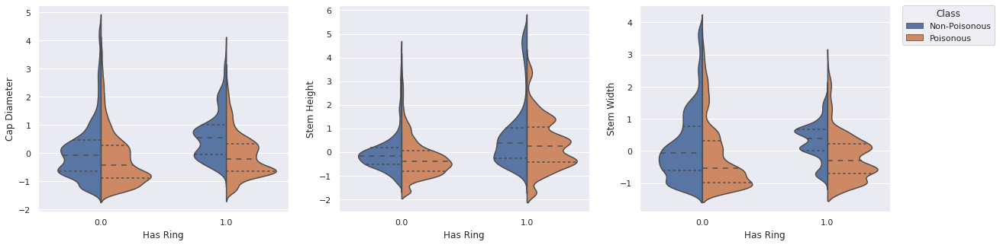

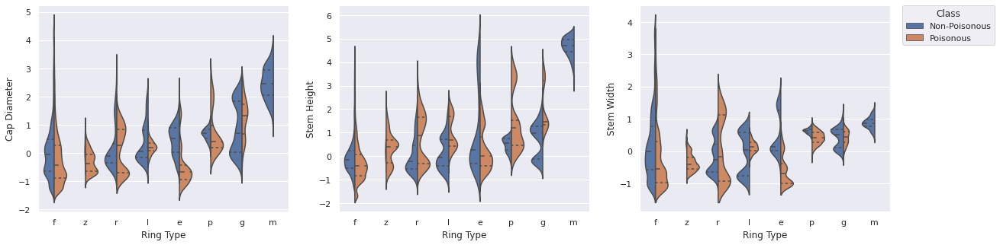

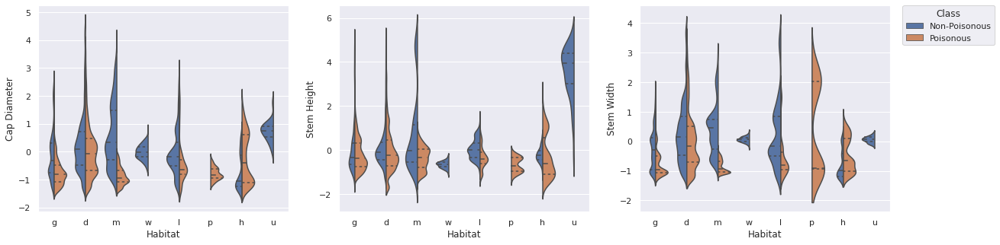

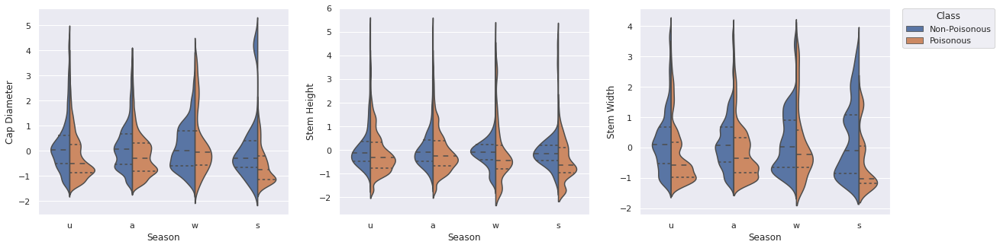

In [ ]:
mushroom_violin = mushroom_sample.copy()
mushroom_violin['class'] = mushroom_sample['class'].map({1: 'Poisonous', 0:'Non-Poisonous'})
mushroom_violin['does-bruise-or-bleed'] = mushroom_sample['does-bruise-or-bleed'].map({1: 'Yes', 0:'No'})

# Code for Violin Plots obtained from Dr. Eric Larson's repository
cat_feats_to_compare = [*np.arange(2,9), *np.arange(11,18)]

for col in cat_feats_to_compare:
    plt.figure(figsize=(20,5))
    ax1 = plt.subplot(1,3,1)
    ax2 = plt.subplot(1,3,2)
    ax3 = plt.subplot(1,3,3)

    sns.violinplot(x=mushroom_violin.columns[col], y="cap-diameter", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax1,
              legend=False) # scale the size of the plot by the count within each group
    ax1.set_xlabel(camel_case(mushroom_violin.columns[col]))
    ax1.set_ylabel('Cap Diameter')
    ax1.get_legend().remove()


    sns.violinplot(x=mushroom_violin.columns[col], y="stem-height", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax2,
              legend = False)
    ax2.get_legend().remove()
    ax2.set_xlabel(camel_case(mushroom_violin.columns[col]))
    ax2.set_ylabel('Stem Height')


    sns.violinplot(x=mushroom_violin.columns[col], y="stem-width", hue="class", data=mushroom_violin,
               split=True,
               inner="quart",
               scale="count",
              ax = ax3)
    ax3.set_xlabel(camel_case(mushroom_violin.columns[col]))
    ax3.set_ylabel('Stem Width')


    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
               title = 'Class')
    plt.show()

## **Checking for imbalanced classes for Cap Colors**

Text(0.5, 0, 'Mushroom cap colors')

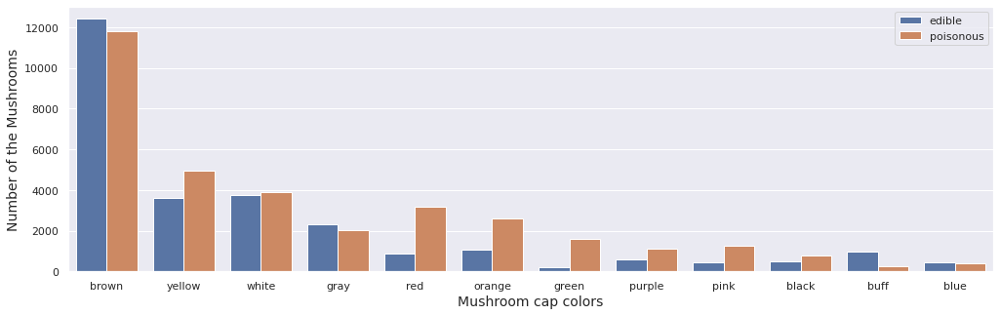

In [ ]:
plt.figure(figsize=(17, 5))
splot = sns.countplot(data=mushroom_imputed, x="cap-color", hue="class",order=mushroom_imputed['cap-color'].value_counts().index)
splot.set_xticklabels(['brown', 'yellow', 'white', 'gray', 'red', 'orange','green','purple','pink','black','buff','blue'])
# brown=n, buff=b, gray=g, green=r, pink=p, purple=u, red=e, white=w, yellow=y, blue=l, orange=o, black=k
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom cap colors', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the aboce plot we can observe that there the data distribution is not equal. Based on the research, cap-color is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the colors into following groups based on their counts.


*   Group brown - Brown
*   Group yellow-white - yellow and white
*   Group rare - reamining/rare colors




In [ ]:
cap_color_changed =  {'b':'rare', 'e':'rare', 'g':'rare', 'k':'rare', 'l':'rare', 'n':'brown','o':'rare', 'p':'rare', 'r':'rare', 'u':'rare',
            'w':'yellow-white','y':'yellow-white'}
mushroom_imputed["cap-color-cd"] = mushroom_imputed["cap-color"].map(cap_color_changed)

Text(0.5, 0, 'Mushroom cap colors')

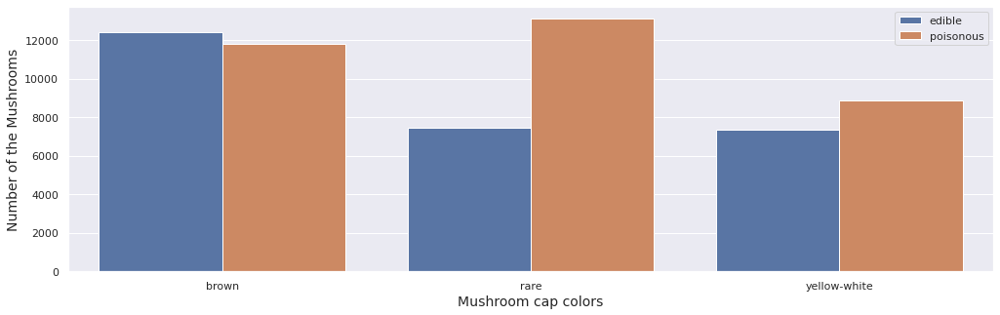

In [ ]:
plt.figure(figsize=(17, 5))
splot = sns.countplot(data=mushroom_imputed, x="cap-color-cd", hue="class",order=mushroom_imputed['cap-color-cd'].value_counts().index)
# splot.set_xticklabels(['Brown', 'Rare', 'Yellow/White'])
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom cap colors', fontsize=14)

In [ ]:
# season_df =  mushroom_imputed_cp.groupby(["season","cap_color_changed","class"])["cap-diameter"].count().reset_index()
# sns.barplot(season_df["season"],season_df["cap-diameter"],hue=season_df["cap_color_changed"])

## **Checking for imbalanced classes for Gill Colors**

Text(0.5, 0, 'Mushroom gill colors')

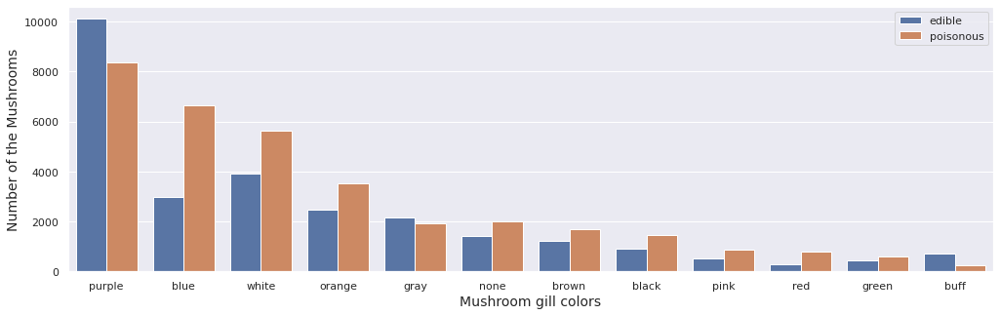

In [ ]:
plt.figure(figsize=(17, 5))
cap_color_changed =  {'b':'buff', 'e':'red', 'g':'gray', 'k':'black', 'l':'blue', 'n':'brown','o':'orange', 'p':'pink', 'r':'green', 'u':'purple',
            'w':'white','y':'yellow','f':"none"}

mushroom_imputed["gill-color-cd"] = mushroom_imputed["gill-color"].map(cap_color_changed)
splot = sns.countplot(data=mushroom_imputed, x="gill-color-cd", hue="class",order=mushroom_imputed['gill-color-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom gill colors', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the aboce plot we can observe that there the data distribution is not equal. Based on the research, gill-color is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the colors into following groups based on their counts.


*   Group b - Purple
*   Group y-w - blue and white
*   Group r - reamining/rare colors




In [ ]:
gill_color_changed = {'buff':"rare", 'red':"rare", 'gray':"rare",'black':"rare", 'blue':"blue-white", 'brown':"rare",'orange':"rare", 'pink':"rare", 'green':"rare", 'purple':"purple",
            'white':"blue-white",'yellow':"rare","none":"rare"}
mushroom_imputed["gill-color-cd"] = mushroom_imputed["gill-color-cd"].map(gill_color_changed)

Text(0.5, 0, 'Mushroom gill colors')

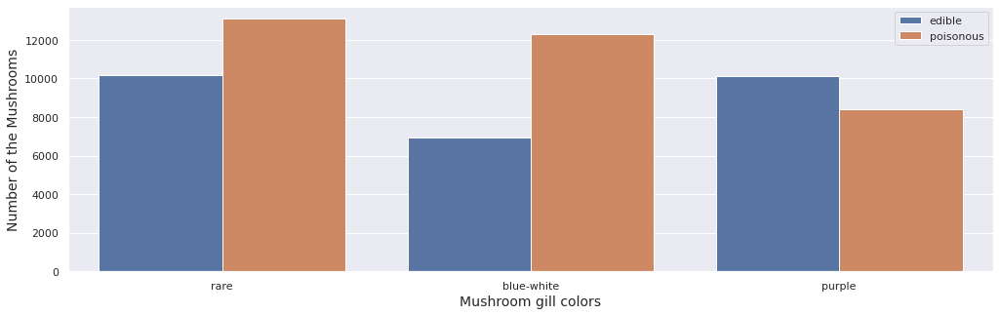

In [ ]:
plt.figure(figsize=(17, 5))

sns.countplot(data=mushroom_imputed, x="gill-color-cd", hue="class",order=mushroom_imputed['gill-color-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom gill colors', fontsize=14)

It is believed that if the gill is white in color then the mushrooms are poisionous. In the above plot we can see that the mushrooms that faill in Blue-white group has 50% chance of being poisionous.

## **Checking for imbalanced classes for Cap Shapes**\

Text(0.5, 0, 'Mushroom cap shapes')

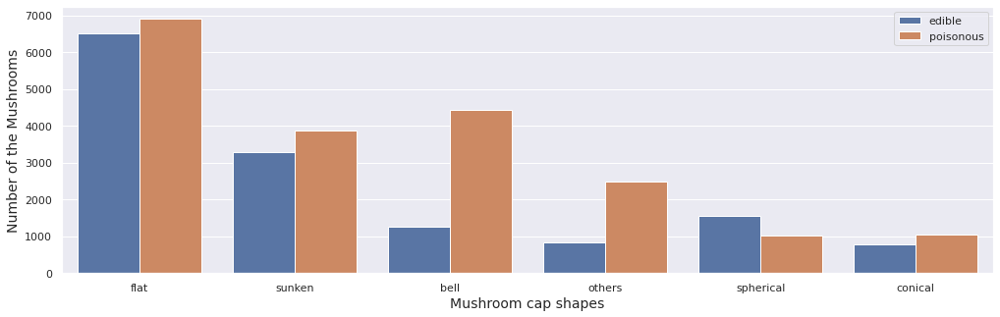

In [ ]:
plt.figure(figsize=(17, 5))
cap_shape_changed =  {'b':'bell', 'c':'conical', 'f':'flat', 's':'sunken', 'p':'spherical', 'o':'others'}

mushroom_imputed["cap-shape-cd"] = mushroom_imputed["cap-shape"].map(cap_shape_changed)
splot = sns.countplot(data=mushroom_imputed, x="cap-shape-cd", hue="class",order=mushroom_imputed['cap-shape-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom cap shapes', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the above plot we can observe that there the data distribution is not equal. Based on the research, cap-shape is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the shapes into following groups based on their counts.


*   Group flat - flat
*   Group sunken-bell - bell and sunken
*   Group r - reamining/rare shapes




In [ ]:
cap_shape_changed = {'bell':'sunken-bell','conical':'rare', 'flat':'flat','sunken':'sunken-bell', 'spherical':'rare', 'others':'rare'}
mushroom_imputed["cap-shape-cd"] = mushroom_imputed["cap-shape-cd"].map(cap_shape_changed)

Text(0.5, 0, 'Mushroom cap shpes')

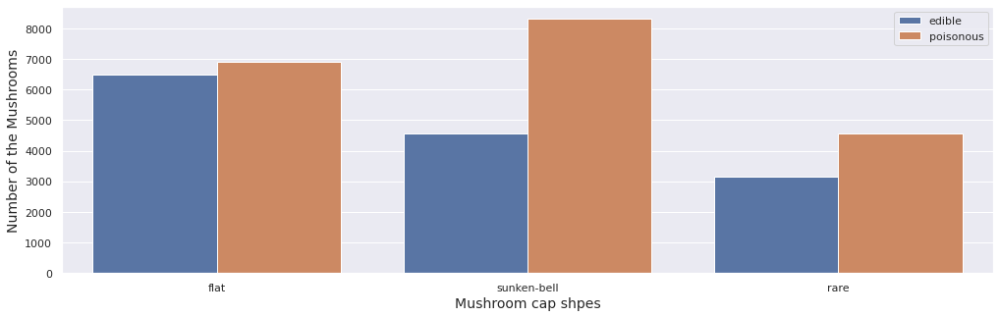

In [ ]:
plt.figure(figsize=(17, 5))

sns.countplot(data=mushroom_imputed, x="cap-shape-cd", hue="class",order=mushroom_imputed['cap-shape-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom cap shapes', fontsize=14)

## **Checking for imbalanced classes for Stem Colors**

Text(0.5, 0, 'Mushroom stem colors')

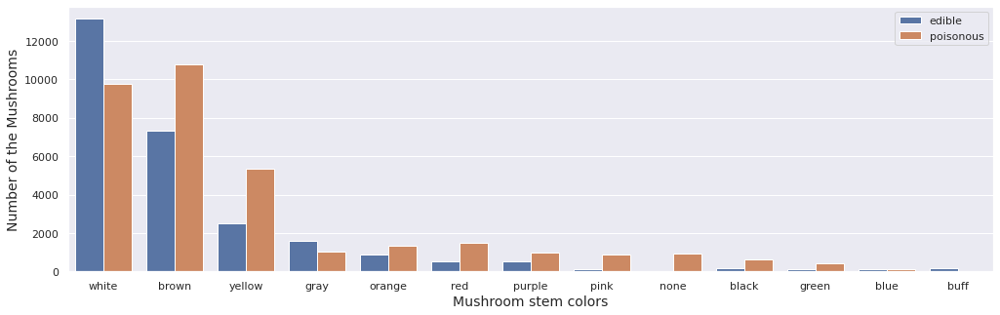

In [ ]:
plt.figure(figsize=(17, 5))
stem_color_changed =  {'b':'buff', 'e':'red', 'g':'gray', 'k':'black', 'l':'blue', 'n':'brown','o':'orange', 'p':'pink', 'r':'green', 'u':'purple',
            'w':'white','y':'yellow','f':"none"}

mushroom_imputed["stem-color-cd"] = mushroom_imputed["stem-color"].map(stem_color_changed)
splot = sns.countplot(data=mushroom_imputed, x="stem-color-cd", hue="class",order=mushroom_imputed['stem-color-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom stem colors', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the aboce plot we can observe that there the data distribution is not equal. Based on the research, gill-color is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the colors into following groups based on their counts.


*   Group white - white
*   Group brown- brown
*   Group rare - remaining/rare colors




In [ ]:
stem_color_changed = {'buff':"rare", 'red':"rare", 'gray':"rare",'black':"rare", 'blue':"rare", 'brown':"brown",'orange':"rare", 'pink':"rare", 'green':"rare", 'purple':"rare",
            'white':"white",'yellow':"rare","none":"rare"}
mushroom_imputed["stem-color-cd"] = mushroom_imputed["stem-color-cd"].map(stem_color_changed)

Text(0.5, 0, 'Mushroom stem colors')

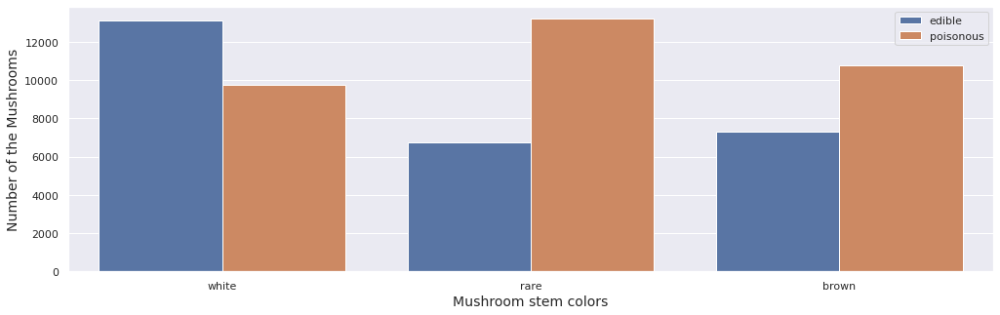

In [ ]:
plt.figure(figsize=(17, 5))

sns.countplot(data=mushroom_imputed, x="stem-color-cd", hue="class",order=mushroom_imputed['stem-color-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom stem colors', fontsize=14)

## **Checking for imbalanced classes for Cap Surface**

In [ ]:
# gill-spacing
# splot = sns.countplot(data=mushroom_imputed, x="gill-spacing", hue="class",order=mushroom_imputed['gill-spacing'].value_counts().index)
# splot = sns.countplot(data=mushroom_imputed, x="stem-root", hue="class",order=mushroom_imputed['stem-root'].value_counts().index)


Text(0.5, 0, 'Mushroom stem surface')

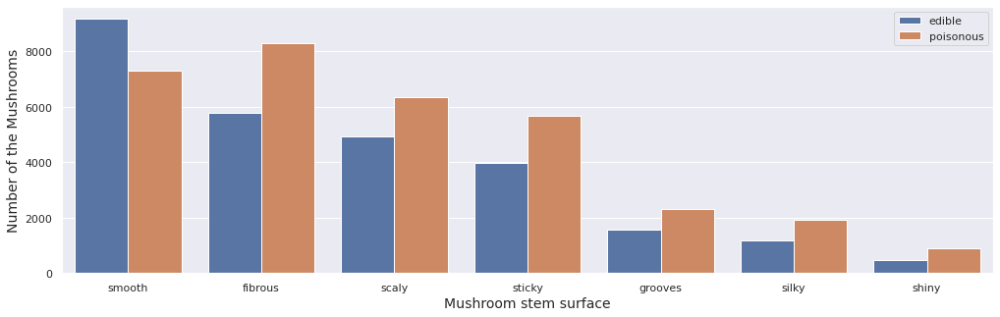

In [ ]:
plt.figure(figsize=(17, 5))
# fibrous=i, grooves=g, scaly=y, smooth=s, shiny=h, leathery=l, silky=k, sticky=t, wrinkled=w, fleshy=e
stem_surface_changed =  {'i':'fibrous', 'g':'grooves', 'y':'scaly', 's':'smooth', 'h':'shiny', 'l':'leathery',
                      'k':'silky', 't':'sticky', 'w':'wrinkled', 'e':'fleshy'
                      }

# fibrous=i, grooves=g, scaly=y, smooth=s, shiny=h, leathery=l, silky=k, sticky=t, wrinkled=w, fleshy=e
# mushroom_imputed["cap-surface-cd"] = mushroom_imputed["cap-surface"].map(cap_surface_changed)
# splot = sns.countplot(data=mushroom_imputed, x="cap-surface-cd", hue="class",order=mushroom_imputed['cap-surface-cd'].value_counts().index)
mushroom_imputed["stem-surface-cd"] = mushroom_imputed["stem-surface"].map(stem_surface_changed)
splot = sns.countplot(data=mushroom_imputed, x="stem-surface-cd", hue="class",order=mushroom_imputed['stem-surface-cd'].value_counts().index)

plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom stem surface', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the aboce plot we can observe that there the data distribution is not equal. Based on the research, cap-shape is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the shapes into following groups based on their counts.


*   Group smooth - smooth
*   Group fibrous - fibrous
*   Group scaly - scaly
*   Group sticky - sticky
*   Group rare - reamining/rare surfaces




In [ ]:
stem_surface_changed = {'fibrous':'fibrous', 'grooves':'rare', 'scaly':'scaly', 'smooth':'smooth', 'shiny':'rare', 'leathery':'rare',
                      'silky':'rare', 'sticky':'sticky', 'wrinkled':'rare', 'fleshy':'rare'
                      }
mushroom_imputed["stem-surface-cd"] = mushroom_imputed["stem-surface-cd"].map(stem_surface_changed)

Text(0.5, 0, 'Mushroom stem surfaces')

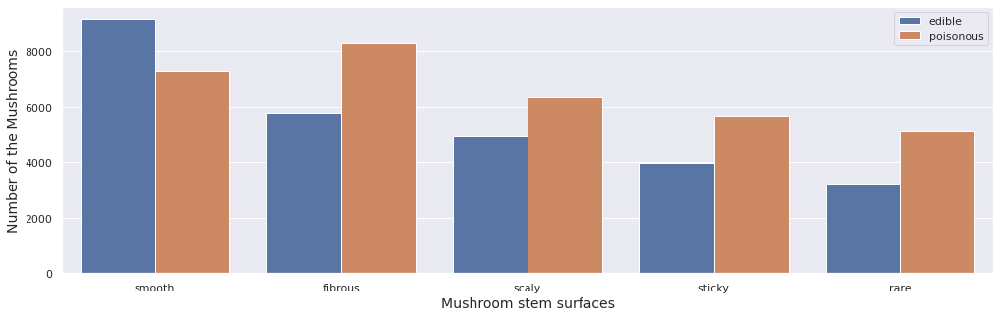

In [ ]:
plt.figure(figsize=(17, 5))

sns.countplot(data=mushroom_imputed, x="stem-surface-cd", hue="class",order=mushroom_imputed['stem-surface-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom stem surfaces', fontsize=14)

## **Checking for imbalanced classes for Ring Type**

Text(0.5, 0, 'Mushroom ring type')

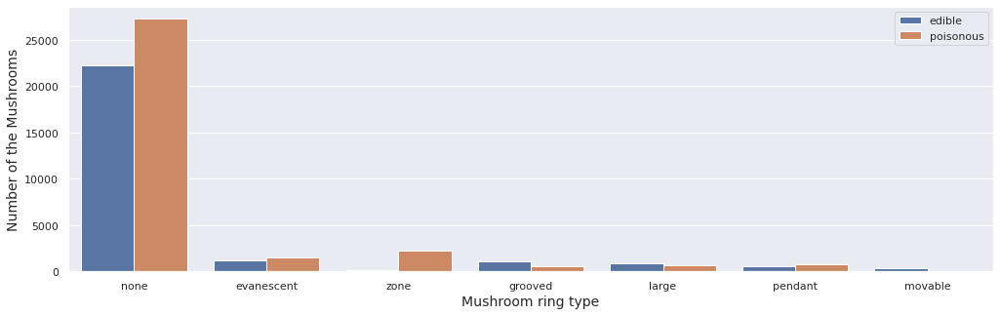

In [ ]:
plt.figure(figsize=(17, 5))

# cobwebby=c, evanescent=e, flaring=r, grooved=g, large=l, pendant=p, sheathing=s, zone=z, scaly=y, movable=m, none=f, unknown=?
# fibrous=i, grooves=g, scaly=y, smooth=s, shiny=h, leathery=l, silky=k, sticky=t, wrinkled=w, fleshy=e
ring_type_changed =  {'c':'cobwebby', 'e':'evanescent', 'g':'grooved', 'l':'large', 'p':'pendant', 's':'sheathing',
                      'z':'zone', 'y':'scaly', 'm':'movable', 'f':'none'
                      }
mushroom_imputed["ring-type-cd"] = mushroom_imputed["ring-type"].map(ring_type_changed)
splot = sns.countplot(data=mushroom_imputed, x="ring-type-cd", hue="class",order=mushroom_imputed['ring-type-cd'].value_counts().index)
# splot = sns.countplot(data=mushroom_imputed, x="ring-type", hue="class",order=mushroom_imputed['ring-type'].value_counts().index)

plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom ring type', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the above plot we can observe that there the data distribution is not equal. Based on the research, ring-type is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the shapes into following groups based on their counts.


*   Group NoRing - None
*   Group Ring - reamining/rare surfaces




In [ ]:
ring_type_changed =  {'cobwebby':'Ring', 'evanescent':'Ring', 'grooved':'Ring', 'large':'Ring', 'pendant':'Ring', 'sheathing':'Ring',
                      'zone':'Ring','scaly':'Ring', 'movable':'Ring', 'none':'NoRing'
                      }
mushroom_imputed["ring-type-cd"] = mushroom_imputed["ring-type-cd"].map(ring_type_changed)

Text(0.5, 0, 'Mushroom ring types')

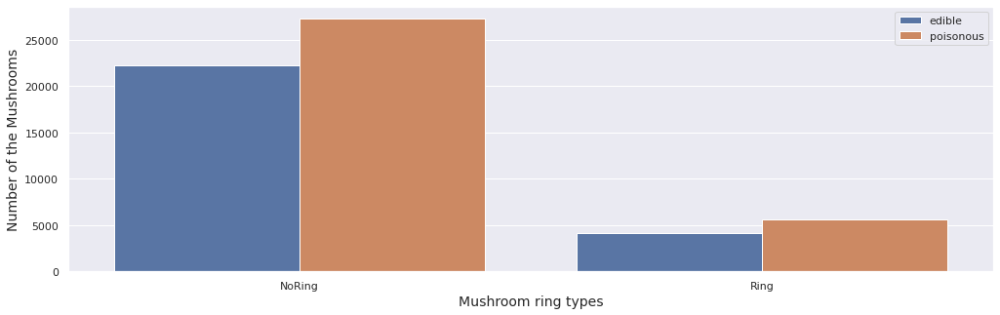

In [ ]:
plt.figure(figsize=(17, 5))

splot = sns.countplot(data=mushroom_imputed, x="ring-type-cd", hue="class",order=mushroom_imputed['ring-type-cd'].value_counts().index)

plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom ring types', fontsize=14)

## **Checking for imbalanced classes for Habitat**

Text(0.5, 0, 'Mushroom stem surface')

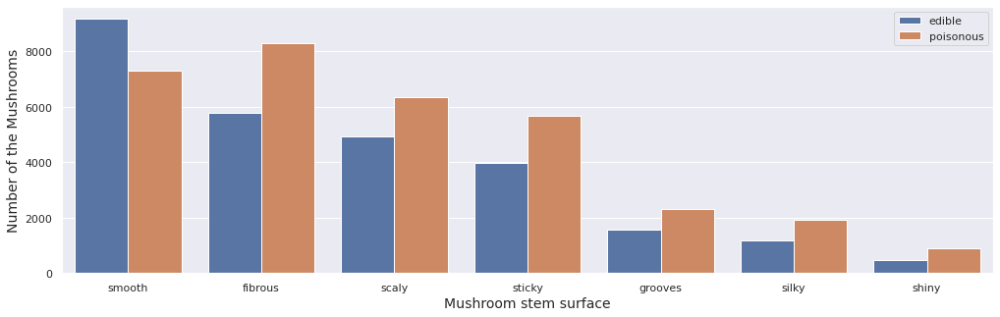

In [ ]:
plt.figure(figsize=(17, 5))
# fibrous=i, grooves=g, scaly=y, smooth=s, shiny=h, leathery=l, silky=k, sticky=t, wrinkled=w, fleshy=e
stem_surface_changed =  {'i':'fibrous', 'g':'grooves', 'y':'scaly', 's':'smooth', 'h':'shiny', 'l':'leathery',
                      'k':'silky', 't':'sticky', 'w':'wrinkled', 'e':'fleshy'
                      }
habitat_map_changed = {'d':'', 'g':'', 'h':'','l':'','m':'','p':'','u':'', 'w':''}
# grasses=g, leaves=l, meadows=m, paths=p, heaths=h, urban=u, waste=w, woods=d
mushroom_imputed["stem-surface-cd"] = mushroom_imputed["stem-surface"].map(stem_surface_changed)
splot = sns.countplot(data=mushroom_imputed, x="habitat", hue="class",order=mushroom_imputed['habitat'].value_counts().index)

splot = sns.countplot(data=mushroom_imputed, x="stem-surface-cd", hue="class",order=mushroom_imputed['stem-surface-cd'].value_counts().index)

plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom stem surface', fontsize=14)
# plt.title('Distribution of the Mushrooms by their Classes and cap color', fontsize=20)

From the aboce plot we can observe that there the data distribution is not equal. Based on the research, cap-shape is one of the important characteristic used to differentiate between the edible and non-edible. In order to have a better balanced dataset, we will group the shapes into following groups based on their counts.


*   Group smooth - smooth
*   Group fibrous - fibrous
*   Group scaly - scaly
*   Group sticky - sticky
*   Group rare - reamining/rare surfaces




In [ ]:
stem_surface_changed = {'fibrous':'fibrous', 'grooves':'rare', 'scaly':'scaly', 'smooth':'smooth', 'shiny':'rare', 'leathery':'rare',
                      'silky':'rare', 'sticky':'sticky', 'wrinkled':'rare', 'fleshy':'rare'
                      }
mushroom_imputed["stem-surface-cd"] = mushroom_imputed["stem-surface-cd"].map(stem_surface_changed)

Text(0.5, 0, 'Mushroom stem surfaces')

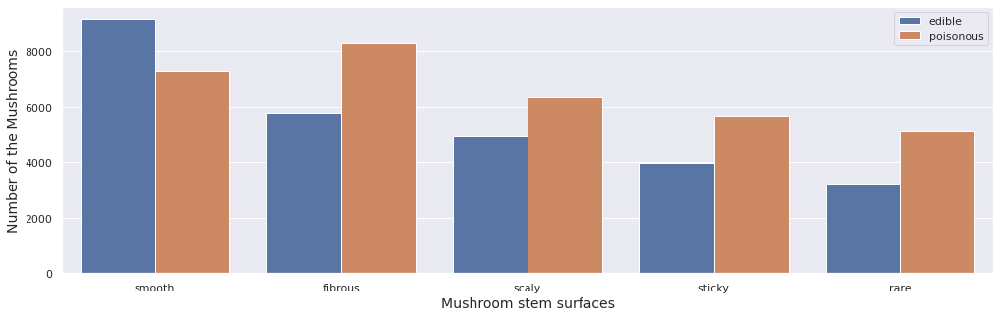

In [ ]:
plt.figure(figsize=(17, 5))

sns.countplot(data=mushroom_imputed, x="stem-surface-cd", hue="class",order=mushroom_imputed['stem-surface-cd'].value_counts().index)
plt.legend(['edible','poisonous'], loc='upper right')
plt.ylabel('Number of the Mushrooms', fontsize=14)
plt.xlabel('Mushroom stem surfaces', fontsize=14)

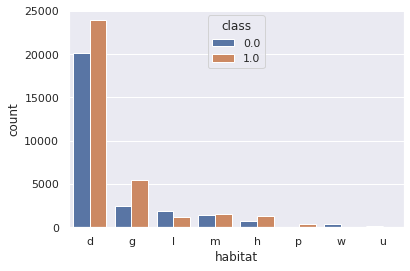

#### **Relationships between Pairs of Numeric Outcomes and Categorical Variables with Categorical Binning**

Here, we re-examine the three most strongly correlated pairs of numeric variables colored by the levels of each categrical variable. However, now the number of levels in each cateogrical variable have been reduced due to class imbalance. The levels with the fewest observations have been binned together to downsize the dataset for potential downstream analysis.

This process may also simplify our visualizations, making it easier to discern patterns in the data without the distraction of a sea of colors.

In [ ]:
# Generate sample to reduce computation time
# Source: https://www.geeksforgeeks.org/python-random-sample-function/
random.seed(7324)
my_sample = random.sample(range(mushroom_imputed.shape[0]), 30000)
mushroom_sample = mushroom_imputed.iloc[my_sample,:].copy()

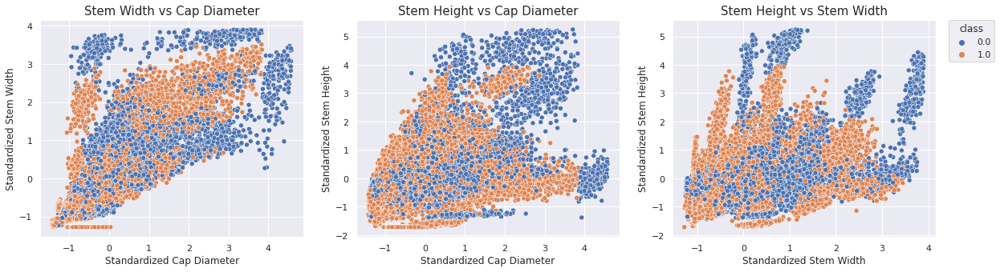

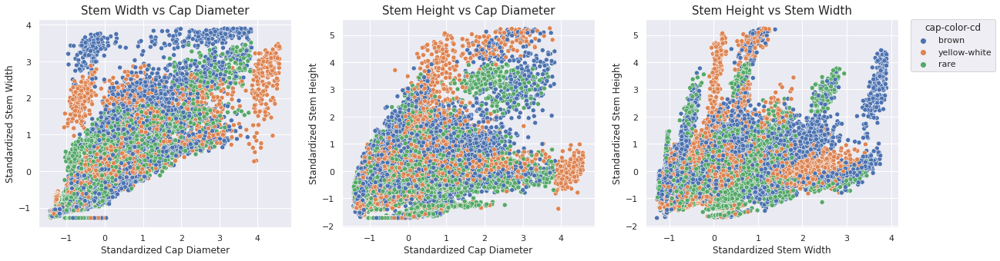

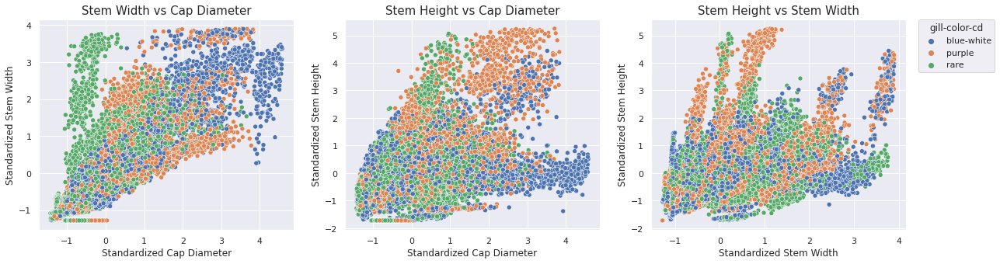

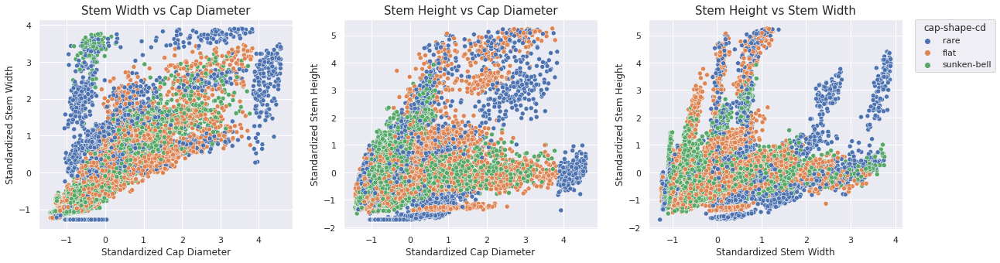

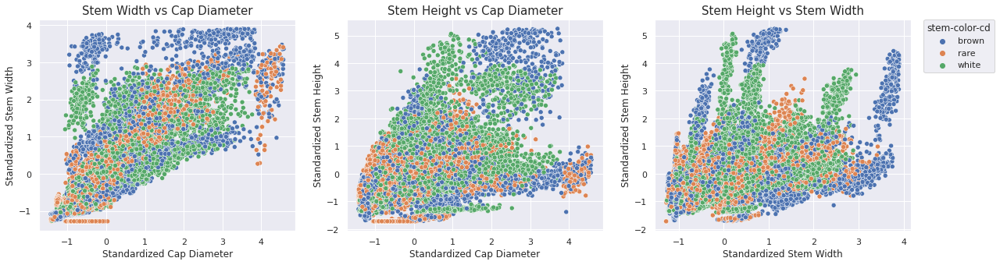

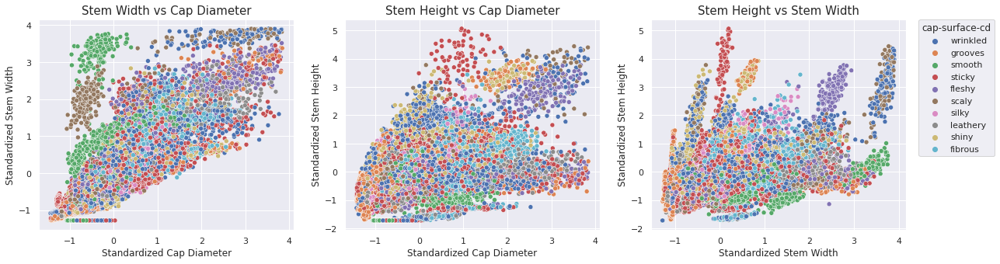

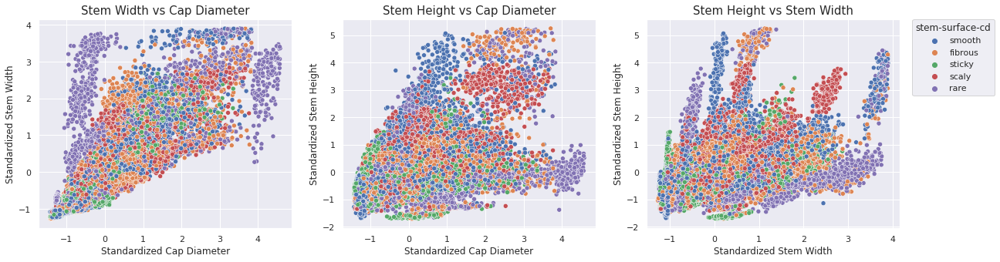

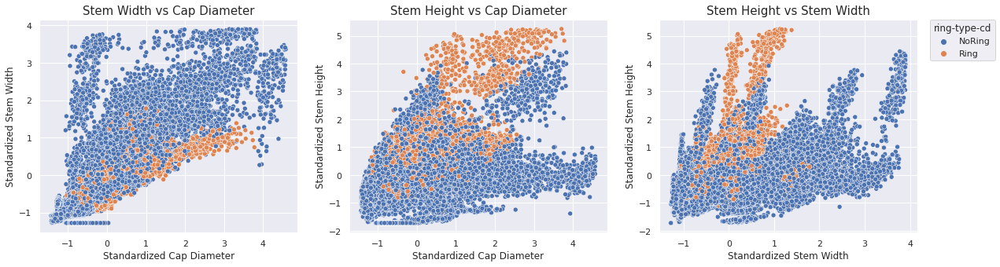

In [ ]:
cat_feats_to_compare = [0, *np.arange(18,25)]
# cat_feats_to_compare = [0, *np.arange(5,7), *np.arange(11,24)]
for var in cat_feats_to_compare:
    plt.figure(figsize=(20,5))
    ax1 = plt.subplot(1,3,1)
    ax2 = plt.subplot(1,3,2)
    ax3 = plt.subplot(1,3,3)

    sns.scatterplot(x=mushroom_sample.iloc[:,1],
                y=mushroom_sample.iloc[:,10],
                hue = mushroom_sample.iloc[:,var],
                ax = ax1, legend = False)
    ax1.set_xlabel("Standardized Cap Diameter")
    ax1.set_ylabel("Standardized Stem Width")
    ax1.set_title("Stem Width vs Cap Diameter", fontsize = 15)

    sns.scatterplot(x=mushroom_sample.iloc[:,1],
                    y=mushroom_sample.iloc[:,9],
                    hue = mushroom_sample.iloc[:,var],
                    ax = ax2, legend = False)
    ax2.set_xlabel("Standardized Cap Diameter")
    ax2.set_ylabel("Standardized Stem Height")
    ax2.set_title("Stem Height vs Cap Diameter", fontsize = 15)

    sns.scatterplot(x=mushroom_sample.iloc[:,10],
                    y=mushroom_sample.iloc[:,9],
                    hue = mushroom_sample.iloc[:,var],
                    ax = ax3)
    ax3.set_xlabel("Standardized Stem Width")
    ax3.set_ylabel("Standardized Stem Height")
    ax3.set_title("Stem Height vs Stem Width", fontsize = 15)
    # Source: https://www.statology.org/seaborn-legend-outside/
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
               title = mushroom_sample.columns[var])
    plt.show()

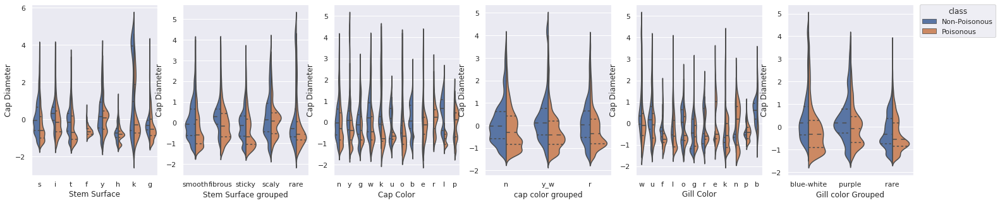

In [ ]:
# Might add or change variables, but just laying down a code template for the violin plots
mushroom_violin = mushroom_sample.copy()
mushroom_violin['class'] = mushroom_sample['class'].map({1: 'Poisonous', 0:'Non-Poisonous'})

# Code for Violin Plots obtained from Dr. Eric Larson's repository
plt.figure(figsize=(25,5))
ax1 = plt.subplot(1,6,1)
ax2 = plt.subplot(1,6,2)
ax3 = plt.subplot(1,6,3)
ax4 = plt.subplot(1,6,4)
ax5 = plt.subplot(1,6,5)
ax6 = plt.subplot(1,6,6)

sns.violinplot(x="stem-surface", y="cap-diameter", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax1,
              legend=False) # scale the size of the plot by the count within each group
ax1.set_xlabel('Stem Surface')
ax1.set_ylabel('Cap Diameter')
ax1.get_legend().remove()

sns.violinplot(x="stem-surface-cd", y="cap-diameter", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax2,
              legend=False) # scale the size of the plot by the count within each group
ax2.set_xlabel('Stem Surface grouped')
ax2.set_ylabel('Cap Diameter')
ax2.get_legend().remove()


sns.violinplot(x="cap-color", y="cap-diameter", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax3,
              legend = False)
ax3.get_legend().remove()
ax3.set_xlabel('Cap Color')
ax3.set_ylabel('Cap Diameter')


sns.violinplot(x="cap-color-cd", y="cap-diameter", hue="class", data=mushroom_violin,
               split=True,
               inner="quart",
               scale="count",
              ax = ax4)
ax4.set_xlabel('cap color grouped')
ax4.set_ylabel('Cap Diameter')
ax4.get_legend().remove()

sns.violinplot(x="gill-color", y="cap-diameter", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax5,
              legend=False) # scale the size of the plot by the count within each group
ax5.set_xlabel('Gill Color')
ax5.set_ylabel('Cap Diameter')
ax5.get_legend().remove()



sns.violinplot(x="gill-color-cd", y="cap-diameter", hue="class", data=mushroom_violin,
               split=True, # split across violins
               inner="quart", # show innner stats like mena, IQR,
               scale="count",
              ax = ax6)
ax6.set_xlabel('Gill color Grouped')
ax6.set_ylabel('Cap Diameter')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
               title = 'class')
plt.show()

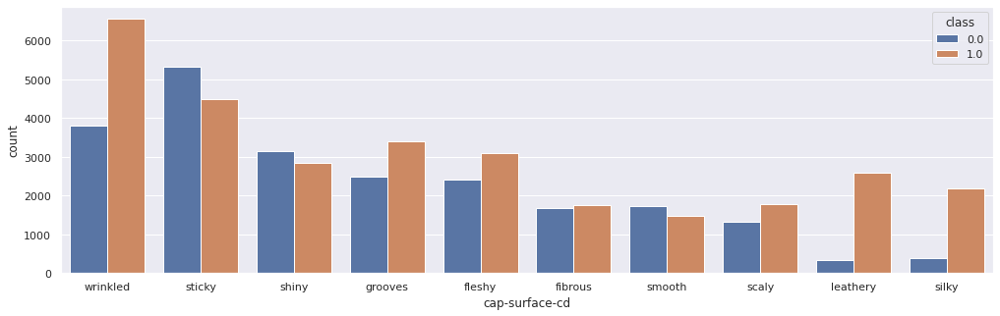

In [ ]:
plt.figure(figsize=(17, 5))
splot = sns.countplot(data=mushroom_imputed, x="cap-surface-cd", hue="class",order=mushroom_imputed['cap-surface-cd'].value_counts().index)


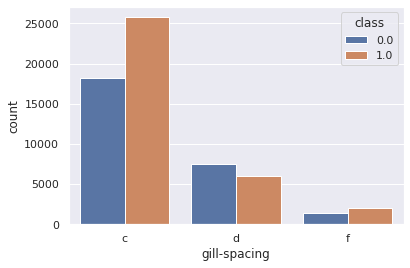

In [ ]:
splot = sns.countplot(data=mushroom_imputed, x="gill-spacing", hue="class",order=mushroom_imputed['gill-spacing'].value_counts().index)
# splot = sns.countplot(data=mushroom_imputed, x="stem-root", hue="class",order=mushroom_imputed['stem-root'].value_counts().index)

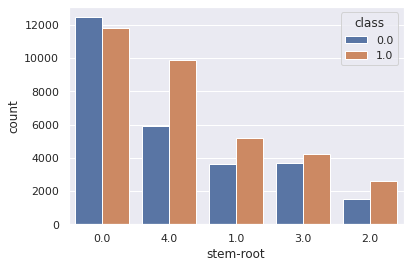

In [ ]:
# splot = sns.countplot(data=mushroom_imputed, x="gill-spacing", hue="class",order=mushroom_imputed['gill-spacing'].value_counts().index)
splot = sns.countplot(data=mushroom_imputed, x="stem-root", hue="class",order=mushroom_imputed['stem-root'].value_counts().index)

##**Reference**
Dataset Information : [https://archive.ics.uci.edu/ml/datasets/Secondary+Mushroom+Dataset]

Seaborn Histogram : [https://datavizpyr.com/histograms-with-seaborn-in-python/#:~:text=distplot%28%29%20function%20in%20Seaborn%20help%20us%20to%20make,the%20distribution%20of%20wind%20variable%20from%20the%20data.]

Duplicated() : [https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.duplicated.html]